# Analysis of the complete final dataset

In [1]:
# import of necessary files from other folders

import os
import sys

# libraries imports

import importlib
import numpy as np
import matplotlib.pyplot as plt
import tempfile
import seaborn as sns
import pandas as pd
import pickle

from IPython.display import Image, display
from PIL import Image
from pathlib import Path
from scipy.integrate import solve_ivp
from matplotlib.colors import LinearSegmentedColormap,TwoSlopeNorm

# Set default figure and axes background color to white
plt.rcParams['figure.facecolor'] = 'white'  # Background for the entire figure
plt.rcParams['axes.facecolor'] = 'white' 

In [2]:
# Function to check if a string can be converted to a float or an integer
def is_number(value):
    try:
        float(value)
        return True
    except ValueError:
        return False

## Import dataset 

In [3]:
df_filtered = pd.read_pickle('path to pickle df (df_92212_networks.pkl)')
len(df_filtered)

92212

## P(int) and P(+)

In [4]:
# count fraction pos
# Function to count positive and negative entries in a matrix
def count_null_entries(A_matrix):
    """
    A_matrix: matrix, n_sxn_r, interaction matrix
    
    RETURNS: list with two elements [num_positive, num_negative]
    """
    A_matrix = np.array(A_matrix)  # Convert the list to a numpy array
    num_null = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] == 0)
    return num_null
    
df_filtered['connectivity']=df_filtered['A'].apply(lambda x: 1-count_null_entries(x)/56)

# count fraction pos
# Function to count positive and negative entries in a matrix
def count_pos_neg_entries(A_matrix):
    """
    A_matrix: matrix, n_sxn_r, interaction matrix
    
    RETURNS: list with two elements [num_positive, num_negative]
    """
    A_matrix = np.array(A_matrix)  # Convert the list to a numpy array
    num_positive = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] > 0)
    num_negative = np.sum(A_matrix[~np.eye(A_matrix.shape[0], dtype=bool)] < 0)
    return [num_positive, num_negative]

# Apply the function to the 'A' column and create a new column 'pos_neg_counts'
df_filtered['pos_neg_counts'] =df_filtered['A'].apply(lambda A_matrix: count_pos_neg_entries(A_matrix))

# Calculate the fraction of positive values (fraction_pos) and fraction of negative values (fraction_neg)
df_filtered['fraction_pos'] = df_filtered.apply(
    lambda row: row['pos_neg_counts'][0] / (row['pos_neg_counts'][0]+row['pos_neg_counts'][1]) if row['connectivity'] != 0 else np.nan, 
    axis=1
)
df_filtered['fraction_neg'] = df_filtered.apply(
    lambda row: row['pos_neg_counts'][1] / (row['pos_neg_counts'][0]+row['pos_neg_counts'][1]) if row['connectivity'] != 0 else np.nan, 
    axis=1
)

# absolute value A and g
df_filtered['g_abs_avg']=df_filtered['g'].apply(lambda x: np.mean(np.abs(x)))
df_filtered['A_abs_avg']=df_filtered['A'].apply(lambda x: np.mean(np.abs(x[(~np.eye(x.shape[0], dtype=bool)) & (x != 0)]))) # do not care about the on diagonal

## Shannon diversity

In [5]:
from scipy.stats import entropy

# Apply the function to compute Shannon diversity and add it as a new column
df_filtered['shannon'] = df_filtered['N_cr'].apply(lambda x: entropy(x[0][-1], base=np.e))

## Visualize on p+ connectivity plane

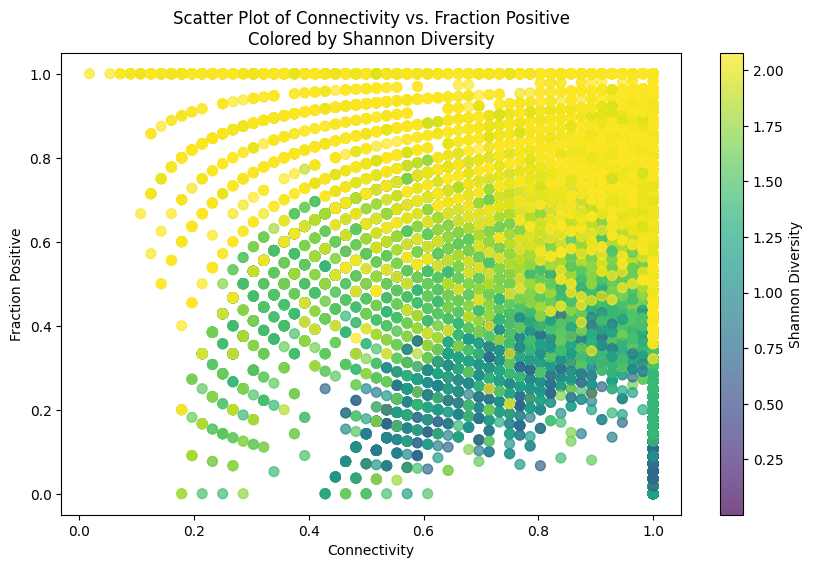

In [6]:
# Scatter plot of individual points with color based on diversity (shannon)
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    x=df_filtered['connectivity'], 
    y=df_filtered['fraction_pos'], 
    c=df_filtered['shannon'], 
    cmap="viridis",  # You can choose a different colormap if preferred
    s=50,  # Adjust the size of points if necessary
    alpha=0.7  # Transparency to handle overlapping points
)

# Add a color bar to indicate the `shannon` diversity
cbar = plt.colorbar(scatter)
cbar.set_label("Shannon Diversity")

# Label axes
plt.xlabel("Connectivity")
plt.ylabel("Fraction Positive")
plt.title("Scatter Plot of Connectivity vs. Fraction Positive\nColored by Shannon Diversity")

plt.show()

## Subsample and visualize

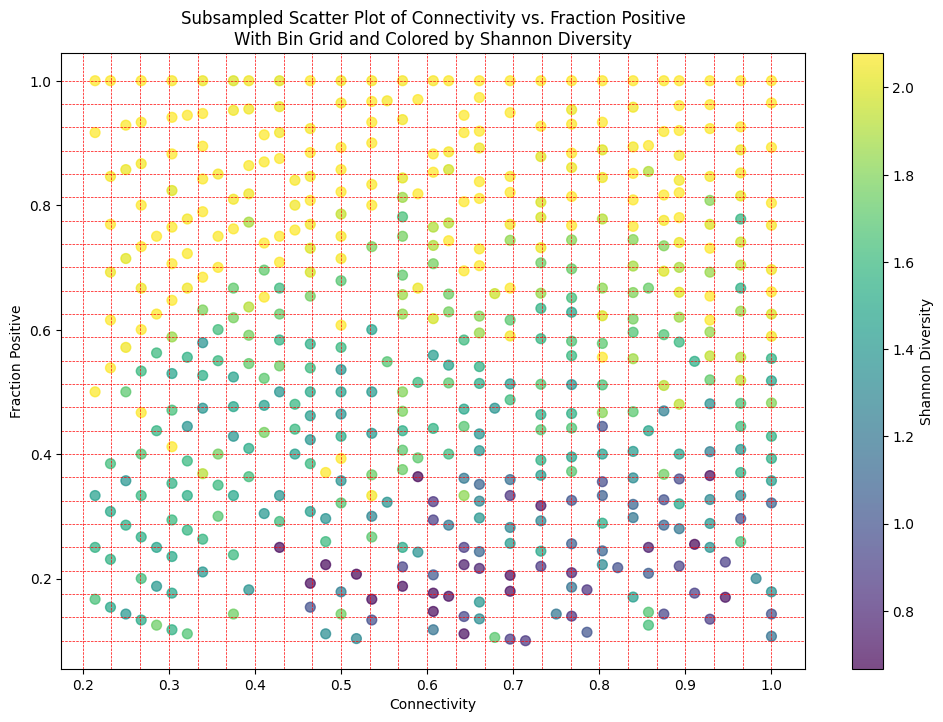

In [7]:
from scipy.spatial import cKDTree

# Filter the data to include only the specified subspace
filtered_subspace = df_filtered[
    (df_filtered['connectivity'] >= 0.2) & 
    (df_filtered['connectivity'] <= 1) & 
    (df_filtered['fraction_pos'] >= 0.1) & 
    (df_filtered['fraction_pos'] <= 1)
]

# Define the number of bins and the number of samples
n_bins_connectivity = 25
n_bins_fraction_pos = 25
n_samples = 500

# Create a mesh grid within the specified range
x_bin_edges = np.linspace(0.2, 1, n_bins_connectivity)
y_bin_edges = np.linspace(0.1, 1, n_bins_fraction_pos)
x_mesh, y_mesh = np.meshgrid(x_bin_edges, y_bin_edges)
grid_points = np.c_[x_mesh.ravel(), y_mesh.ravel()]

# Build a KD-Tree for quick nearest-neighbor lookup
tree = cKDTree(filtered_subspace[['connectivity', 'fraction_pos']].values)

# Find the closest points to the grid points
distances, indices = tree.query(grid_points, k=1)

# Select the unique points closest to the grid points
unique_indices = np.unique(indices)
subsampled_points = filtered_subspace.iloc[unique_indices]

# If the subsample size is greater than required, sample randomly from it
if len(subsampled_points) > n_samples:
    subsampled_points = subsampled_points.sample(n=n_samples, random_state=42)

# Scatter plot with bin grid overlay
plt.figure(figsize=(12, 8))

# Scatter plot of subsampled points
scatter = plt.scatter(
    x=subsampled_points['connectivity'], 
    y=subsampled_points['fraction_pos'], 
    c=subsampled_points['shannon'], 
    cmap="viridis",  # Colormap for Shannon diversity
    s=50, 
    alpha=0.7
)

# Add color bar
cbar = plt.colorbar(scatter)
cbar.set_label("Shannon Diversity")

# Add grid lines to show bin divisions
for x_edge in x_bin_edges:
    plt.axvline(x=x_edge, color='red', linestyle='--', linewidth=0.5)

for y_edge in y_bin_edges:
    plt.axhline(y=y_edge, color='red', linestyle='--', linewidth=0.5)

# Label axes and title
plt.xlabel("Connectivity")
plt.ylabel("Fraction Positive")
plt.title("Subsampled Scatter Plot of Connectivity vs. Fraction Positive\n"
          "With Bin Grid and Colored by Shannon Diversity")

plt.show()

In [8]:
print(len(subsampled_points))

500


In [11]:
subsampled_points.reset_index(drop=True, inplace=True)

In [12]:
subsampled_points.to_pickle('subsampled_df.pkl')

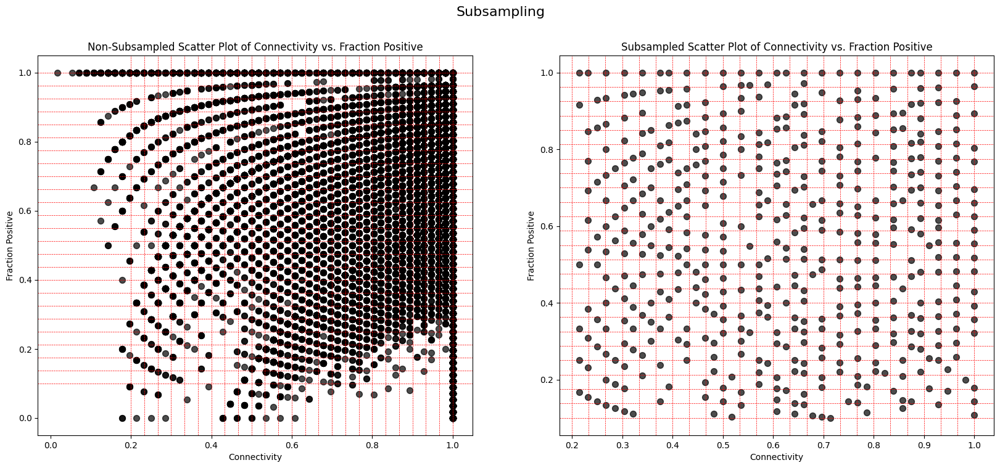

In [11]:
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

# Assuming df_filtered is already defined
# Filter the data to include only the specified subspace
filtered_subspace = df_filtered[
    (df_filtered['connectivity'] >= 0.2) & 
    (df_filtered['connectivity'] <= 1) & 
    (df_filtered['fraction_pos'] >= 0.1) & 
    (df_filtered['fraction_pos'] <= 1)
]

# Define the number of bins and the number of samples
n_bins_connectivity = 25
n_bins_fraction_pos = 25
n_samples = 500

# Create a mesh grid within the specified range
x_bin_edges = np.linspace(0.2, 1, n_bins_connectivity)
y_bin_edges = np.linspace(0.1, 1, n_bins_fraction_pos)
x_mesh, y_mesh = np.meshgrid(x_bin_edges, y_bin_edges)
grid_points = np.c_[x_mesh.ravel(), y_mesh.ravel()]

# Build a KD-Tree for quick nearest-neighbor lookup
tree = cKDTree(filtered_subspace[['connectivity', 'fraction_pos']].values)

# Find the closest points to the grid points
distances, indices = tree.query(grid_points, k=1)

# Select the unique points closest to the grid points
unique_indices = np.unique(indices)
subsampled_points = filtered_subspace.iloc[unique_indices]

# If the subsample size is greater than required, sample randomly from it
if len(subsampled_points) > n_samples:
    subsampled_points = subsampled_points.sample(n=n_samples, random_state=42)

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Left subplot: Non-subsampled dataset
axes[0].scatter(
    x=df_filtered['connectivity'], 
    y=df_filtered['fraction_pos'], 
    c='black', 
    s=50, 
    alpha=0.7
)
axes[0].set_xlabel("Connectivity")
axes[0].set_ylabel("Fraction Positive")
axes[0].set_title("Non-Subsampled Scatter Plot of Connectivity vs. Fraction Positive")
for x_edge in x_bin_edges:
    axes[0].axvline(x=x_edge, color='red', linestyle='--', linewidth=0.5)
for y_edge in y_bin_edges:
    axes[0].axhline(y=y_edge, color='red', linestyle='--', linewidth=0.5)

# Right subplot: Subsampled dataset
scatter = axes[1].scatter(
    x=subsampled_points['connectivity'], 
    y=subsampled_points['fraction_pos'], 
    c='black', 
    s=50, 
    alpha=0.7
)
axes[1].set_xlabel("Connectivity")
axes[1].set_ylabel("Fraction Positive")
axes[1].set_title("Subsampled Scatter Plot of Connectivity vs. Fraction Positive")
for x_edge in x_bin_edges:
    axes[1].axvline(x=x_edge, color='red', linestyle='--', linewidth=0.5)
for y_edge in y_bin_edges:
    axes[1].axhline(y=y_edge, color='red', linestyle='--', linewidth=0.5)

plt.suptitle("Subsampling", fontsize=16)
plt.show()

## Continue with complete

In [13]:
df_filtered['A/sigma_g'] = df_filtered['A_abs_avg'] / df_filtered['g'].apply(np.std)
df_filtered['A/g'] = df_filtered['A_abs_avg'] / df_filtered['g_abs_avg']

/tmp/ipykernel_2048237/819900262.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_system = cm.get_cmap('tab20', num_systems)  # Choose a colormap with enough distinct colors


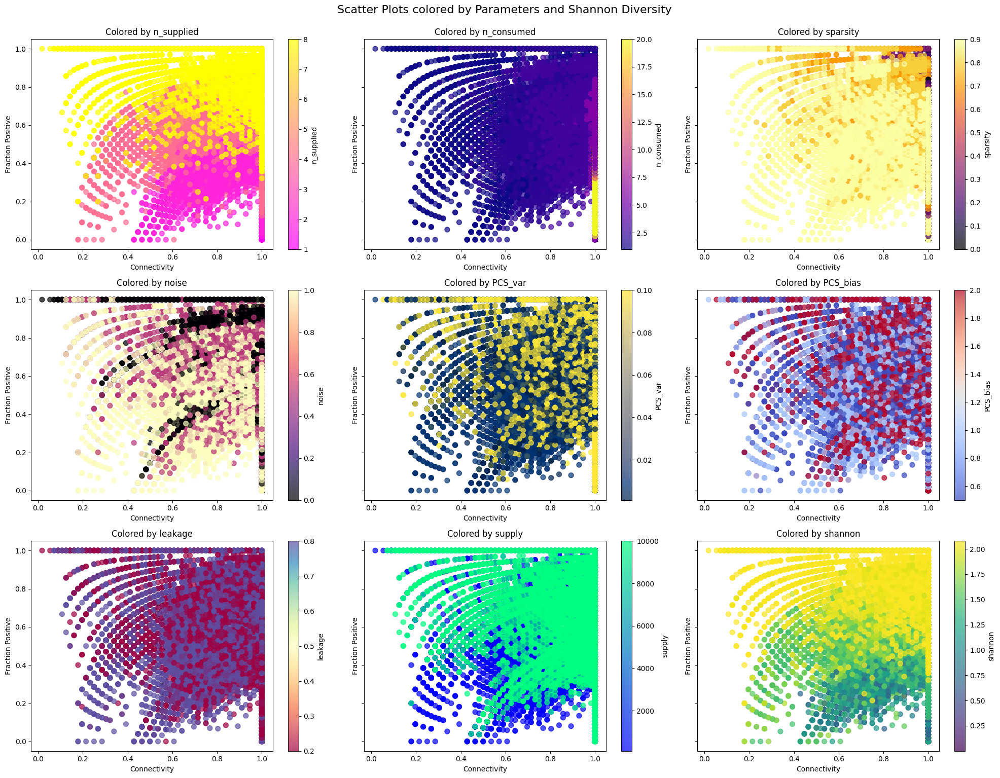

In [38]:
from matplotlib import cm

# Define columns to plot
columns_to_plot = ['n_supplied', 'n_consumed', 'sparsity', 'noise', 'PCS_var', 'PCS_bias',
                   'leakage', 'supply', 'shannon']
num_plots = len(columns_to_plot)

# Define colormap order
colormap_order = ['spring', 'plasma', 'inferno', 'magma', 'cividis', 'coolwarm', 'Spectral', 'winter', 'viridis']

# Create subplots: adjust the number of rows and columns as needed (3 rows here)
fig, axes = plt.subplots(3, 3, figsize=(20, 15), sharey=True)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Create a color map for the `system` column
system_values = df_filtered['system'].unique()  # Get unique system types
num_systems = len(system_values)
cmap_system = cm.get_cmap('tab20', num_systems)  # Choose a colormap with enough distinct colors

# Create a mapping from system string to color
system_color_map = {system: cmap_system(i) for i, system in enumerate(system_values)}

for i, column in enumerate(columns_to_plot):
    cmap = colormap_order[i]  # Select the colormap from the specified order

    if column == 'system':
        # Map each value of 'system' to a color
        colors = df_filtered[column].map(system_color_map)

        scatter = axes[i].scatter(
            x=df_filtered['connectivity'],
            y=df_filtered['fraction_pos'],
            c=colors,
            s=50,
            alpha=0.7
        )
        # Create a custom legend for system column
        handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=cmap_system(j), markersize=10, label=system)
                   for j, system in enumerate(system_values)]
        axes[i].legend(handles=handles, title='System', bbox_to_anchor=(1.05, 1), loc='upper left')

    else:
        scatter = axes[i].scatter(
            x=df_filtered['connectivity'],
            y=df_filtered['fraction_pos'],
            c=df_filtered[column],
            cmap=cmap,
            s=50,
            alpha=0.7
        )
        cbar = plt.colorbar(scatter, ax=axes[i])
        cbar.set_label(column)

    axes[i].set_title(f"Colored by {column}")
    axes[i].set_xlabel("Connectivity")
    axes[i].set_ylabel("Fraction Positive")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.suptitle("Scatter Plots colored by Parameters and Shannon Diversity", y=1.02, fontsize=16)
plt.show()

## Adding missing metrics

In [15]:

# Function to calculate off-diagonal mean
def calculate_off_diag_mean(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return off_diag_values.mean()

# Function to calculate standard deviation
def calculate_std(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    off_diag_values = matrix[~np.eye(matrix.shape[0], dtype=bool)]  # Exclude diagonal
    return np.std(off_diag_values)

# Apply functions to calculate the off-diagonal mean and standard deviation
df_filtered['mean_off_diag'] = df_filtered['A'].apply(calculate_off_diag_mean)
df_filtered['std_A'] = df_filtered['A'].apply(calculate_std)

# Function to calculate average correlation between a_ij and a_ji
def calculate_avg_correlation(matrix):
    matrix = np.array(matrix)  # Ensure it's a NumPy array
    i_indices, j_indices = np.triu_indices_from(matrix, k=1)  # Indices for upper triangle (non-diagonal)
    a_ij = matrix[i_indices, j_indices]  # Extract upper triangle values
    a_ji = matrix[j_indices, i_indices]  # Extract corresponding lower triangle values
    return np.corrcoef(a_ij, a_ji)[0, 1]  # Correlation coefficient

# Function to calculate variance of the g vector
def calculate_variance(vector):
    vector = np.array(vector)  # Ensure it's a NumPy array
    return np.var(vector)

# Assuming df_filtered['A'] contains the matrices and df_filtered['g'] contains the vectors
df_filtered['avg_correlation'] = df_filtered['A'].apply(calculate_avg_correlation)
df_filtered['variance_g'] = df_filtered['g'].apply(calculate_variance)

/users/fsibilla/env_MES/lib64/python3.9/site-packages/numpy/lib/_function_base_impl.py:2922: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/users/fsibilla/env_MES/lib64/python3.9/site-packages/numpy/lib/_function_base_impl.py:2923: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [16]:
# self interaction

def average_diagonal(matrix):
    diagonal_elements = np.diag(matrix)
    return np.mean(diagonal_elements)

# Apply the function to the 'matrix' column and create a new column 'self_int'
df_filtered['self_int'] = df_filtered['A'].apply(average_diagonal)

## Analysis of correlations

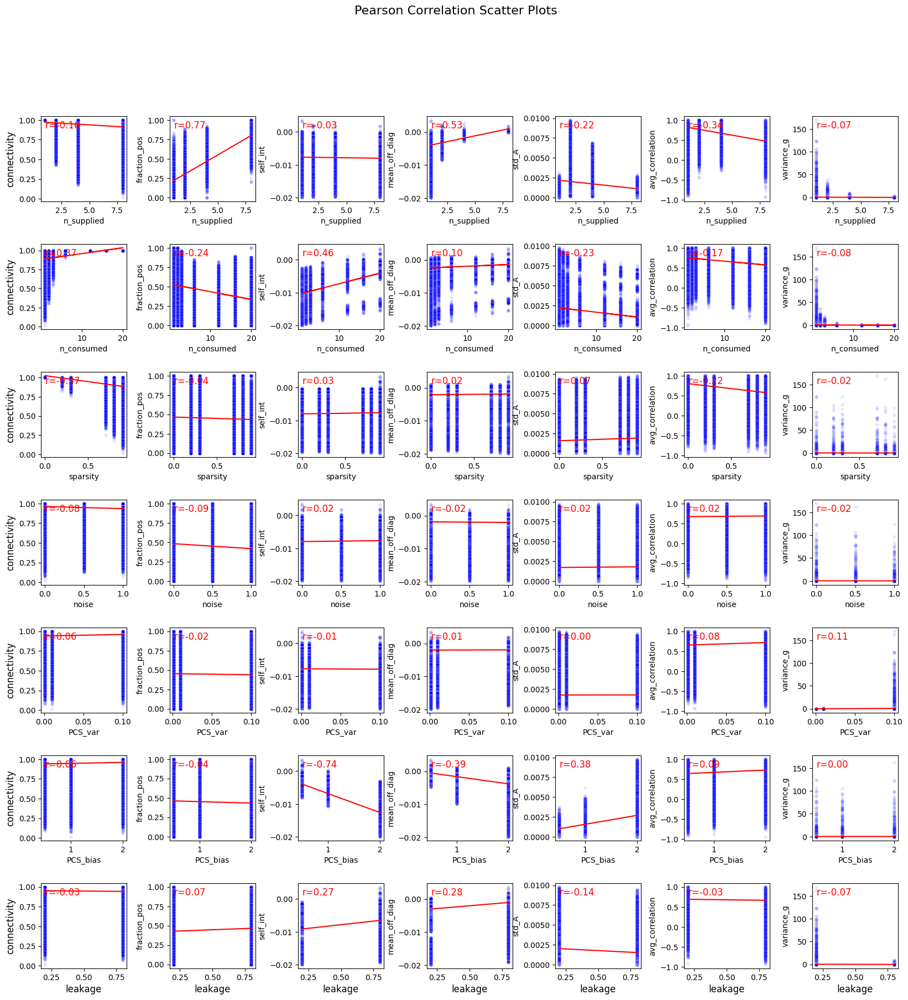

In [17]:
from scipy.stats import pearsonr
# simple Pearson correlations between all variables

# List of independent and dependent variables
independent_vars = ['n_supplied', 'n_consumed', 'sparsity', 'noise', 'PCS_var', 'PCS_bias', 'leakage']
dependent_vars = ['connectivity', 'fraction_pos', 'self_int', 'mean_off_diag', 'std_A', 'avg_correlation', 'variance_g']

# Create a 7x7 grid of subplots
fig, axes = plt.subplots(7, 7, figsize=(20, 20))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

# Iterate over independent and dependent variables to create scatter plots
for i, indep in enumerate(independent_vars):
    for j, dep in enumerate(dependent_vars):
        ax = axes[i, j]
        
        # Ensure the data is numeric
        df = df_filtered[[indep, dep]].apply(pd.to_numeric, errors='coerce')
        df = df.dropna()
        
        # Scatter plot
        sns.scatterplot(x=df[indep], y=df[dep], ax=ax, s=20, color='b', alpha=0.1)
        
        # Fit and plot Pearson regression line
        if len(df) > 1:  # Ensure there are enough points to fit a line
            slope, intercept = np.polyfit(df[indep], df[dep], 1)
            ax.plot(df[indep], slope * df[indep] + intercept, color='red')
        
            # Calculate and display Pearson correlation coefficient
            r, _ = pearsonr(df[indep], df[dep])
            ax.text(0.05, 0.95, f'r={r:.2f}', transform=ax.transAxes, ha='left', va='top', fontsize=12, color='red')
        
        # Set axis labels
        if j == 0:
            ax.set_ylabel(dep, fontsize=12)
        if i == 6:
            ax.set_xlabel(indep, fontsize=12)

# Set a main title for the figure
fig.suptitle('Pearson Correlation Scatter Plots', fontsize=16)
plt.show()

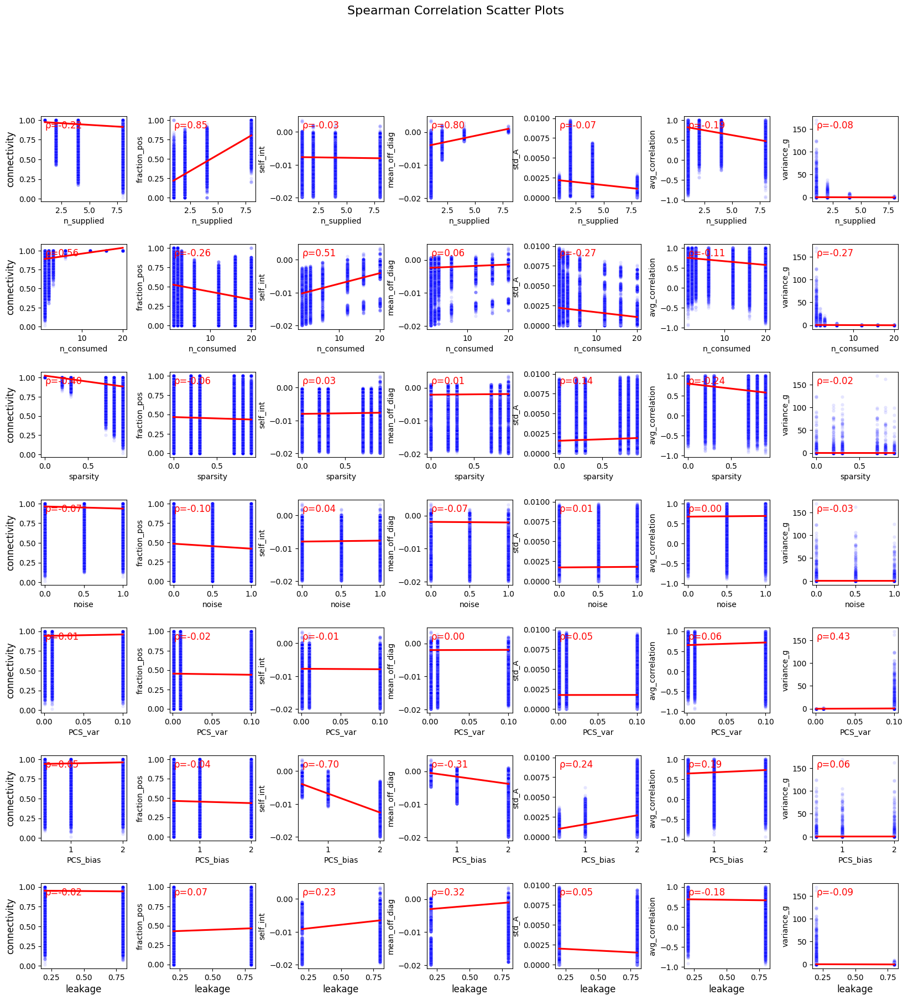

In [66]:
from scipy.stats import spearmanr
import statsmodels.api as sm

# List of independent and dependent variables
independent_vars = ['n_supplied', 'n_consumed', 'sparsity', 'noise', 'PCS_var', 'PCS_bias', 'leakage']
dependent_vars = ['connectivity', 'fraction_pos', 'self_int', 'mean_off_diag', 'std_A', 'avg_correlation', 'variance_g']

# Create a 7x7 grid of subplots
fig, axes = plt.subplots(7, 7, figsize=(20, 20))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

# Iterate over independent and dependent variables to create scatter plots
for i, indep in enumerate(independent_vars):
    for j, dep in enumerate(dependent_vars):
        ax = axes[i, j]
        
        # Ensure the data is numeric
        df = df_filtered[[indep, dep]].apply(pd.to_numeric, errors='coerce')
        df = df.dropna()
        
        # Scatter plot
        sns.scatterplot(x=df[indep], y=df[dep], ax=ax, s=20, color='b', alpha=0.1)
        
        # Fit and plot Spearman regression line
        if len(df) > 1:  # Ensure there are enough points to calculate the correlation
            # Calculate Spearman's rank correlation coefficient
            rho, p_value = spearmanr(df[indep], df[dep])
            
            # Display Spearman correlation coefficient
            ax.text(0.05, 0.95, f'ρ={rho:.2f}', transform=ax.transAxes, ha='left', va='top', fontsize=12, color='red')
            
            # Add a line for visual interpretation (use lowess or similar if non-linear trends are prominent)
            sns.regplot(x=df[indep], y=df[dep], ax=ax, scatter=False, color='red', lowess=False)

        # Set axis labels
        if j == 0:
            ax.set_ylabel(dep, fontsize=12)
        if i == 6:
            ax.set_xlabel(indep, fontsize=12)

# Set a main title for the figure
fig.suptitle('Spearman Correlation Scatter Plots', fontsize=16)
plt.show()

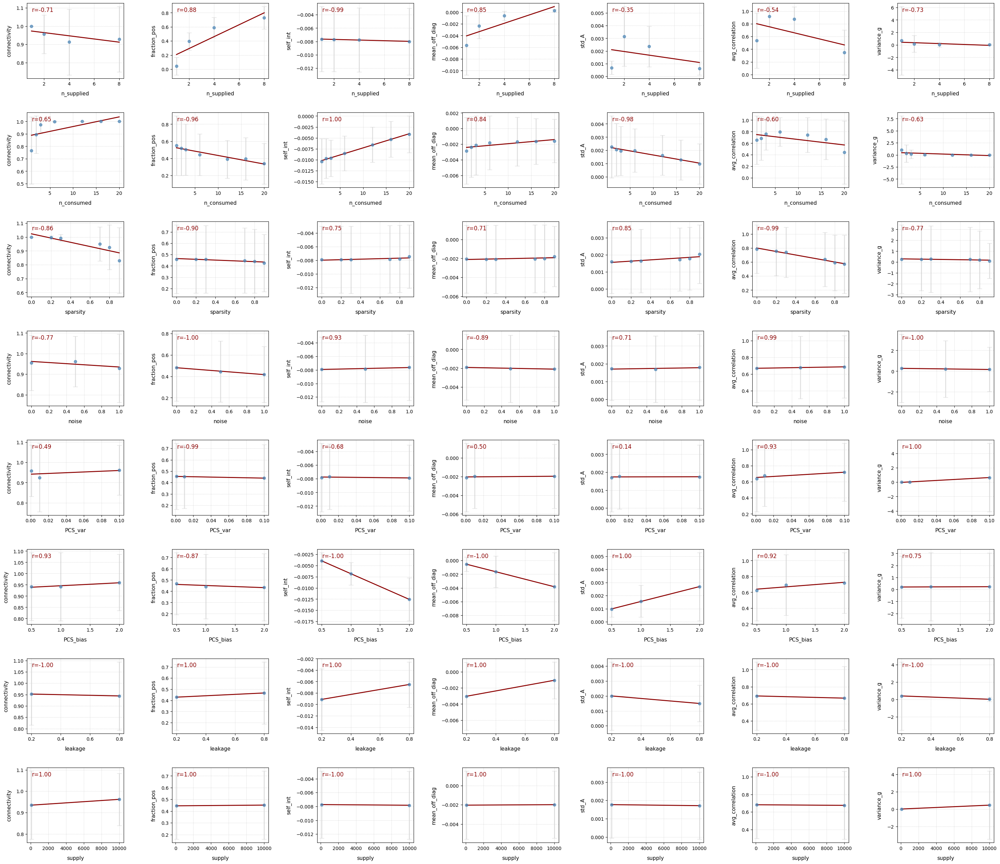

In [82]:
# Create a 7x7 grid of subplots
fig, axes = plt.subplots(8, 7, figsize=(30, 26))
fig.subplots_adjust(hspace=0.3, wspace=0.3, top=0.92)  # Reduce space under title and adjust subplot spacing

# Iterate over independent and dependent variables to create scatter plots
for i, indep in enumerate(independent_vars):
    for j, dep in enumerate(dependent_vars):
        ax = axes[i, j]
        
        # Ensure the data is numeric
        df = df_filtered[[indep, dep]].apply(pd.to_numeric, errors='coerce')
        df = df.dropna()
        
        if not df.empty:
            # Group by unique values of the independent variable and calculate averages and standard deviations
            grouped = df.groupby(indep).agg(
                mean=(dep, 'mean'),
                std=(dep, 'std')
            ).reset_index()
            x_avg = grouped[indep]
            y_avg = grouped['mean']
            y_std = grouped['std']

            # Scatter plot of averages with error bars
            ax.errorbar(x=x_avg, y=y_avg, yerr=y_std, fmt='o', color='steelblue', ecolor='lightgray', elinewidth=2, capsize=5, alpha=0.7)
        
            if len(grouped) > 1:  # Ensure there are enough points to fit a line
                # Fit and plot Pearson regression line
                slope, intercept = np.polyfit(x_avg, y_avg, 1)
                ax.plot(x_avg, slope * x_avg + intercept, color='darkred', lw=2)
            
                # Calculate and display Pearson correlation coefficient
                r, _ = pearsonr(x_avg, y_avg)
                ax.text(0.05, 0.95, f'r={r:.2f}', transform=ax.transAxes, ha='left', va='top', fontsize=12, color='darkred')
        
        # Set axis labels for each subplot with better positioning
        ax.set_xlabel(indep, fontsize=11, labelpad=10)
        ax.set_ylabel(dep, fontsize=11, labelpad=10)

        # Add a grid to make reading values easier
        ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.6)

# Adjust layout to avoid overlap and make room for labels
plt.tight_layout(pad=3.0)


# Show the plot
plt.show()

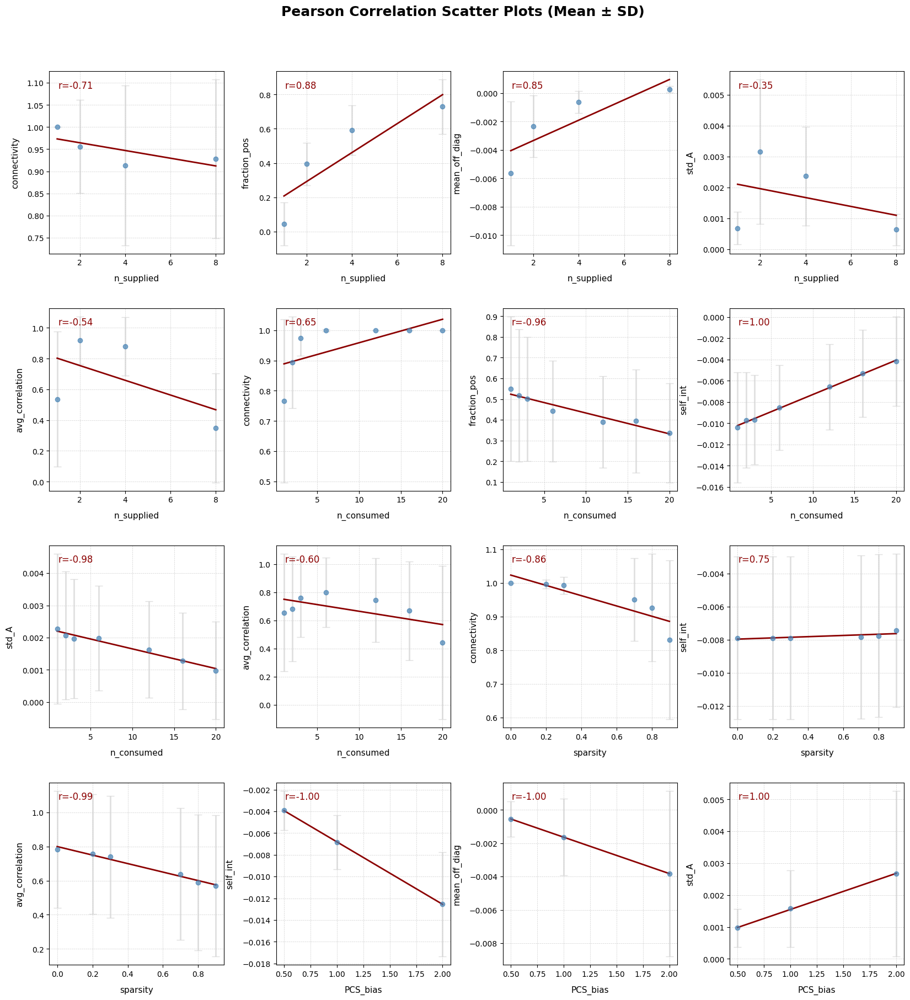

In [76]:
# Selected plots by their (i, j) indices
selected_plots = [(0, 0), (0, 1), (0, 3), (0, 4), (0, 5), (1, 0), (1, 1), (1, 2), (1, 4), (1, 5), (2, 0), (2, 2), (2, 5), (5, 2), (5, 3), (5, 4)]

# Create a 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(20, 20))
fig.subplots_adjust(hspace=0.3, wspace=0.3, top=0.92)  # Reduce space under title and adjust subplot spacing

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Iterate over selected plots to create scatter plots
for plot_index, (i, j) in enumerate(selected_plots):
    ax = axes[plot_index]
    indep = independent_vars[i]
    dep = dependent_vars[j]
    
    # Ensure the data is numeric
    df = df_filtered[[indep, dep]].apply(pd.to_numeric, errors='coerce')
    df = df.dropna()
    
    if not df.empty:
        # Group by unique values of the independent variable and calculate averages and standard deviations
        grouped = df.groupby(indep).agg(
            mean=(dep, 'mean'),
            std=(dep, 'std')
        ).reset_index()
        x_avg = grouped[indep]
        y_avg = grouped['mean']
        y_std = grouped['std']

        # Scatter plot of averages with error bars
        ax.errorbar(x=x_avg, y=y_avg, yerr=y_std, fmt='o', color='steelblue', ecolor='lightgray', elinewidth=2, capsize=5, alpha=0.7)
    
        if len(grouped) > 1:  # Ensure there are enough points to fit a line
            # Fit and plot Pearson regression line
            slope, intercept = np.polyfit(x_avg, y_avg, 1)
            ax.plot(x_avg, slope * x_avg + intercept, color='darkred', lw=2)
        
            # Calculate and display Pearson correlation coefficient
            r, _ = pearsonr(x_avg, y_avg)
            ax.text(0.05, 0.95, f'r={r:.2f}', transform=ax.transAxes, ha='left', va='top', fontsize=12, color='darkred')
    
    # Set axis labels for each subplot with better positioning
    ax.set_xlabel(indep, fontsize=11, labelpad=10)
    ax.set_ylabel(dep, fontsize=11, labelpad=10)

    # Add a grid to make reading values easier
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.6)

# Remove empty subplots if any
for k in range(plot_index + 1, len(axes)):
    fig.delaxes(axes[k])

# Set a main title for the figure with reduced space under it
fig.suptitle('Pearson Correlation Scatter Plots (Mean ± SD)', fontsize=18, fontweight='bold')

# Show the plot
plt.show()

## Linear mixed models

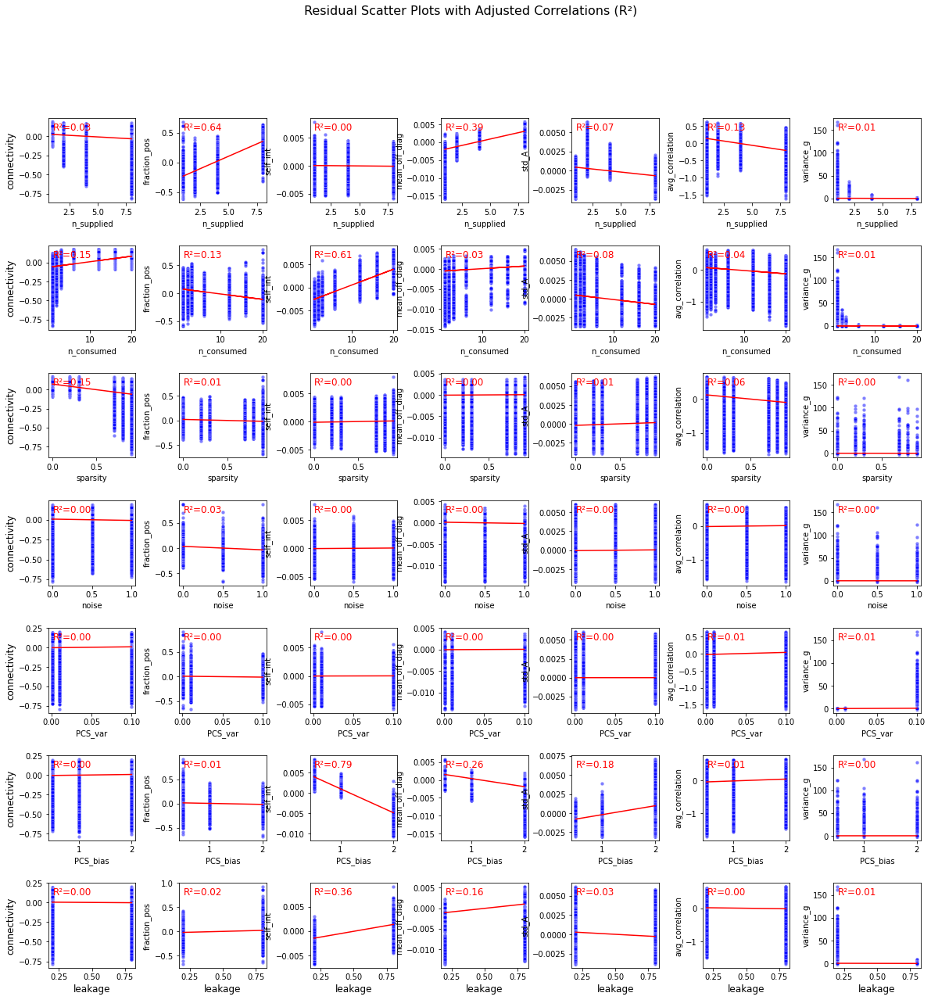

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# List of independent and dependent variables
independent_vars = ['n_supplied', 'n_consumed', 'sparsity', 'noise', 'PCS_var', 'PCS_bias', 'leakage']
dependent_vars = ['connectivity', 'fraction_pos', 'self_int', 'mean_off_diag', 'std_A', 'avg_correlation', 'variance_g']

# Create a 7x7 grid of subplots
fig, axes = plt.subplots(7, 7, figsize=(20, 20))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

# Iterate over independent and dependent variables
for i, indep in enumerate(independent_vars):
    for j, dep in enumerate(dependent_vars):
        ax = axes[i, j]
        
        # Ensure the data is numeric
        df = df_filtered[independent_vars + [dep]].apply(pd.to_numeric, errors='coerce')
        df = df.dropna()
        
        # Prepare data
        X = df[independent_vars].drop(columns=[indep])  # Confounding factors (all other independent variables)
        y = df[dep]
        X_primary = df[indep]  # Variable of interest
        
        if len(df) > 1:  # Ensure there are enough points
            # Fit linear regression model for confounders
            model = LinearRegression()
            model.fit(X, y)
            
            # Get residuals from the confounders model
            residuals = y - model.predict(X)
            
            # Fit regression of residuals on primary variable
            model_primary = LinearRegression()
            model_primary.fit(X_primary.values.reshape(-1, 1), residuals)
            residual_predictions = model_primary.predict(X_primary.values.reshape(-1, 1))
            
            # Calculate R^2 for the correlation strength
            r2 = r2_score(residuals, residual_predictions)
            
            # Scatter plot residuals vs primary variable
            sns.scatterplot(x=X_primary, y=residuals, ax=ax, s=20, color='b', alpha=0.5)
            
            # Plot regression line for residuals
            slope = model_primary.coef_[0]
            intercept = model_primary.intercept_
            ax.plot(X_primary, slope * X_primary + intercept, color='red')
            
            # Annotate with R^2 value
            ax.text(0.05, 0.95, f'R²={r2:.2f}', transform=ax.transAxes, 
                    ha='left', va='top', fontsize=12, color='red')
        
        # Set axis labels
        if j == 0:
            ax.set_ylabel(dep, fontsize=12)
        if i == 6:
            ax.set_xlabel(indep, fontsize=12)

# Set a main title for the figure
fig.suptitle('Residual Scatter Plots with Adjusted Correlations (R²)', fontsize=16)
plt.show()

## Lasso regression for features meaning

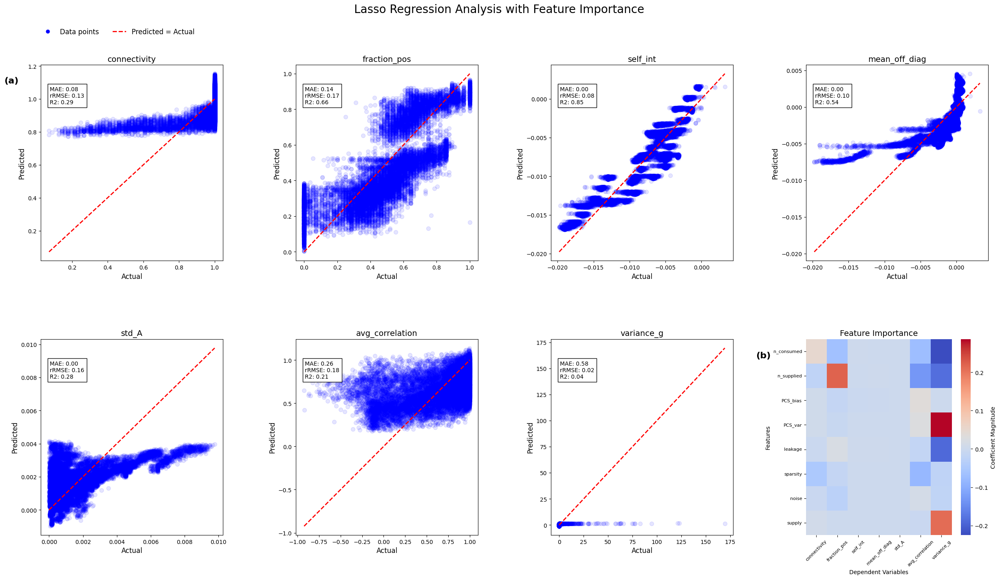

In [86]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from matplotlib.lines import Line2D

# Define list of dependent variables and features
dependent_vars = ['connectivity', 'fraction_pos', 'self_int', 'mean_off_diag', 'std_A', 'avg_correlation', 'variance_g']
features = ['n_consumed', 'n_supplied', 'PCS_bias', 'PCS_var', 'leakage', 'sparsity', 'noise', 'supply']

# Create a 2x4 grid of subplots
fig, axes = plt.subplots(2, 4, figsize=(30, 15), gridspec_kw={'width_ratios': [1, 1, 1, 1], 'height_ratios': [1, 1]})
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing

# Prepare a list to store the feature importance for each dependent variable
importance_dict = {var: [] for var in dependent_vars}

# Create empty lists for handles and labels (for the legend)
handles, labels = [], []

# Create a list to store regression parameters and metrics
regression_params = []

# Iterate over the dependent variables
for i, target in enumerate(dependent_vars):
    # Define features and target
    X = df_filtered[features]
    y = df_filtered[target]

    # Preprocessing: Handle NaNs and infinities
    X = X.apply(pd.to_numeric, errors='coerce').fillna(X.mean())
    y = pd.to_numeric(y, errors='coerce').fillna(y.mean())
    X = X.replace([np.inf, -np.inf], np.nan).fillna(X.mean())
    y = y.replace([np.inf, -np.inf], np.nan).fillna(y.mean())

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Normalize the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Lasso Regression with Cross-Validation
    lasso = LassoCV(cv=5, random_state=42)
    lasso.fit(X_train, y_train)

    # Predict
    y_pred = lasso.predict(X_test)

    # Evaluate
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))/(np.max(y_test) - np.min(y_test))
    r2 = r2_score(y_test, y_pred)

    # Collect regression coefficients and evaluation metrics
    regression_params.append({
        'Dependent Variable': target,
        'Coefficients': dict(zip(features, lasso.coef_)),
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2
    })

    # Plot predicted vs actual
    ax = axes[i // 4, i % 4]  # Adjust for 2x4 layout
    scatter = ax.scatter(y_test, y_pred, c='blue', alpha=0.1, s=50)  # Data points
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)  # Actual = Predicted line
    
    # Set labels, title, and statistics text
    ax.set_xlabel('Actual', fontsize=12)
    ax.set_ylabel('Predicted', fontsize=12)
    ax.set_title(f'{target}', fontsize=14)
    ax.text(0.05, 0.8, f'MAE: {mae:.2f}\nrRMSE: {rmse:.2f}\nR2: {r2:.2f}', 
            transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.99, edgecolor='black'))

    # Collect feature importance
    for feature, coef in zip(features, lasso.coef_):
        importance_dict[target].append(coef)
    
    # Collect handles and labels for the legend
    if i == 0:  # Only add legend once (for the first plot)
        handles.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label='Data points'))
        handles.append(Line2D([0], [0], color='r', linestyle='--', linewidth=2, label='Actual = Predicted'))
        labels.append('Data points')
        labels.append('Predicted = Actual')

# Convert the dictionary of feature importance to a pandas DataFrame
importance_df = pd.DataFrame(importance_dict, index=features)

# Fill the empty subplot (bottom-right corner) with the heatmap
heatmap_ax = axes[1, 3]
sns.heatmap(importance_df, cmap='coolwarm', cbar_kws={'label': 'Coefficient Magnitude'}, ax=heatmap_ax, annot_kws={'size': 10})
heatmap_ax.set_title('Feature Importance', fontsize=14)
heatmap_ax.set_xlabel('Dependent Variables', fontsize=10)
heatmap_ax.set_ylabel('Features', fontsize=10)
heatmap_ax.tick_params(axis='x', labelrotation=45, labelsize=8)
heatmap_ax.tick_params(axis='y', labelsize=8)

# Remove the axes around the empty subplot (if applicable)
for ax in axes.flat:
    if not hasattr(ax, 'has_data') or not ax.has_data():
        fig.delaxes(ax)

# Set a main title for the figure
fig.suptitle('Lasso Regression Analysis with Feature Importance', fontsize=20)

# Add labels (a) and (b) for the subfigures
fig.text(0.095, 0.85, "(a)", fontsize=16, fontweight="bold", transform=fig.transFigure)  # Label for the scatter plots
fig.text(0.71, 0.40, "(b)", fontsize=16, fontweight="bold", transform=fig.transFigure)  # Label for the heatmap

# Add a unified legend to the figure
fig.legend(handles=handles, labels=labels, loc='upper left', ncol=2, fontsize=12, bbox_to_anchor=(0.12, 0.95), frameon=False)

# Save the scatter plot figure as a high-resolution image
plt.savefig('lasso_regression_analysis_with_heatmap_and_legend.png', dpi=300, bbox_inches='tight')
plt.show()

# Save the regression parameters and metrics to a text file
with open('lasso_regression_parameters.txt', 'w') as f:
    for params in regression_params:
        f.write(f"Dependent Variable: {params['Dependent Variable']}\n")
        f.write("Coefficients:\n")
        for feature, coef in params['Coefficients'].items():
            f.write(f"  {feature}: {coef:.4f}\n")
        f.write(f"MAE: {params['MAE']:.4f}\n")
        f.write(f"rRMSE: {params['RMSE']:.4f}\n")
        f.write(f"R2: {params['R2']:.4f}\n")
        f.write("\n")

In [26]:
# Define list of dependent variables and features
dependent_vars = ['connectivity', 'fraction_pos', 'self_int', 'mean_off_diag', 'std_A', 'avg_correlation', 'variance_g']
features = ['n_consumed', 'n_supplied', 'PCS_bias', 'PCS_var', 'leakage', 'sparsity', 'noise', 'supply']

# Prepare a list to store the feature importance for each dependent variable
importance_dict = {var: [] for var in dependent_vars}

# Create a list to store regression parameters and metrics
regression_params = []

# Iterate over the dependent variables
for target in dependent_vars:
    # Define features and target
    X = df_filtered[features]
    y = df_filtered[target]

    # Preprocessing: Handle NaNs and infinities
    X = X.apply(pd.to_numeric, errors='coerce').fillna(X.mean())
    y = pd.to_numeric(y, errors='coerce').fillna(y.mean())
    X = X.replace([np.inf, -np.inf], np.nan).fillna(X.mean())
    y = y.replace([np.inf, -np.inf], np.nan).fillna(y.mean())

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Normalize the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Lasso Regression with Cross-Validation
    lasso = LassoCV(cv=5, random_state=42)
    lasso.fit(X_train, y_train)

    # Predict
    y_pred = lasso.predict(X_test)

    # Evaluate
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    # Collect regression coefficients and evaluation metrics
    regression_params.append({
        'Dependent Variable': target,
        'Coefficients': dict(zip(features, lasso.coef_)),
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'y_test': y_test,
        'y_pred': y_pred,
        'X_test': X_test
    })

# Save the regression parameters and metrics to a text file
with open('lasso_regression_parameters.txt', 'w') as f:
    for params in regression_params:
        f.write(f"Dependent Variable: {params['Dependent Variable']}\n")
        f.write("Coefficients:\n")
        for feature, coef in params['Coefficients'].items():
            f.write(f"  {feature}: {coef:.4f}\n")
        f.write(f"MAE: {params['MAE']:.4f}\n")
        f.write(f"RMSE: {params['RMSE']:.4f}\n")
        f.write(f"R2: {params['R2']:.4f}\n")
        f.write("\n")

/tmp/ipykernel_2048237/1804950980.py:50: UserWarning: Mismatched number of handles and labels: len(handles) = 1 len(labels) = 0
  fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2, fontsize=12, bbox_to_anchor=(0.5, 1.02), frameon=False)
/tmp/ipykernel_2048237/1804950980.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2, fontsize=12, bbox_to_anchor=(0.5, 1.02), frameon=False)


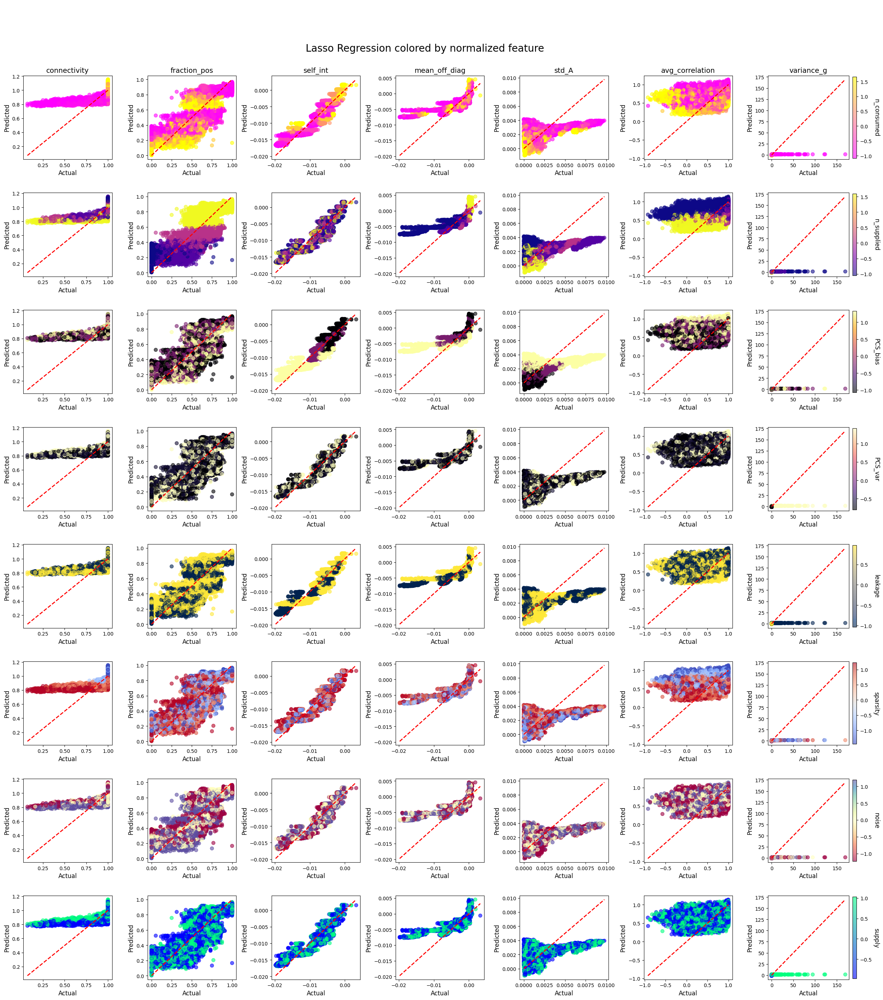

In [39]:
# Create a 7x7 grid of subplots
fig, axes = plt.subplots(8, 7, figsize=(30, 30))
fig.subplots_adjust(hspace=0.4, wspace=0.4, top=0.95)  # Adjust spacing and reduce whitespace at the top

# Define metrics for coloring
color_metrics = ['n_consumed', 'n_supplied', 'PCS_bias', 'PCS_var', 'leakage', 'sparsity', 'noise','supply']

# Define colormaps for each metric
colormaps = ['spring', 'plasma', 'inferno', 'magma', 'cividis', 'coolwarm', 'Spectral','winter']

# Create empty lists for handles and labels (for the legend)
handles, labels = [], []

# Iterate over the color metrics (rows)
for row_idx, (color_metric, cmap) in enumerate(zip(color_metrics, colormaps)):
    # Iterate over the dependent variables (columns)
    for col_idx, target in enumerate(dependent_vars):
        # Get the regression parameters for the current target
        params = next(item for item in regression_params if item['Dependent Variable'] == target)
        y_test = params['y_test']
        y_pred = params['y_pred']
        X_test = params['X_test']
        
        # Plot predicted vs actual
        ax = axes[row_idx, col_idx]
        scatter = ax.scatter(y_test, y_pred, c=X_test[:, features.index(color_metric)], alpha=0.6, s=50, cmap=cmap)  # Data points
        ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)  # Actual = Predicted line
        
        # Set labels, title, and statistics text
        if row_idx == 0:  # Only set title for the first row
            ax.set_title(f'{target}', fontsize=14)
        if col_idx == 0:  # Only set y-label for the first column
            ax.set_ylabel(f'{color_metric}', fontsize=12)
        ax.set_xlabel('Actual', fontsize=12)
        ax.set_ylabel('Predicted', fontsize=12)

        # Add colorbar to the right of the rightmost subplot
        if col_idx == 6:
            cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
            cbar.ax.set_ylabel(color_metric, rotation=270, labelpad=15, fontsize=12)

        # Collect handles and labels for the legend
        if row_idx == 0 and col_idx == 0:  # Only add legend once (for the first plot)
            handles.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label='Data points'))

# Set a main title for the figure
fig.suptitle('Lasso Regression colored by normalized feature ', fontsize=20)

# Add a unified legend to the figure
fig.legend(handles=handles, labels=labels, loc='upper center', ncol=2, fontsize=12, bbox_to_anchor=(0.5, 1.02), frameon=False)

# Save the scatter plot figure as a high-resolution image
plt.savefig('lasso_regression_analysis_multiple_metrics.png', dpi=300, bbox_inches='tight')
plt.show()

## Random forest with feature importance

Training models

In [41]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# List of dependent variables
dependent_vars = ['connectivity', 'fraction_pos', 'self_int', 'mean_off_diag', 'std_A', 'avg_correlation', 'variance_g']

# Features for the model
features = ['n_consumed', 'n_supplied', 'PCS_bias', 'PCS_var', 'leakage', 'sparsity', 'noise', 'supply']

# Prepare a table to store the results for each dependent variable
results_table = pd.DataFrame(columns=['Dependent Variable', 'Optimal Number of Features', 'Selected Features', 'Eliminated Features', 'MSE', 'R²'])

# Dictionary to store the trained models
trained_models = {}

# Iterate over each dependent variable
for target in dependent_vars:
    # Define X (features) and y (target)
    X = df_filtered[features]
    y = df_filtered[target]

    X = X.apply(pd.to_numeric, errors='coerce')  # Convert to numeric, replace invalid with NaN
    y = pd.to_numeric(y, errors='coerce') 

    X = X.fillna(X.mean())  # Replace NaNs in features with column mean
    y = y.fillna(y.mean())  # Replace NaNs in target with mean
    
    X = X.replace([np.inf, -np.inf], np.nan).fillna(X.mean())  # Replace infinities in features
    y = y.replace([np.inf, -np.inf], np.nan).fillna(y.mean()) 
    
    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Initialize the RandomForest Regressor
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    
    # Recursive Feature Elimination with Cross-Validation (RFECV)
    rfecv = RFECV(estimator=rf, step=1, cv=5, scoring='neg_mean_squared_error')  # Use cross-validation for evaluation
    rfecv.fit(X_train, y_train)
    
    # Print the optimal number of features and the selected/eliminated features
    optimal_features = X.columns[rfecv.support_]
    eliminated_features = X.columns[~rfecv.support_]
    
    # Train the Random Forest with the selected features
    X_train_selected = X_train[optimal_features]
    X_test_selected = X_test[optimal_features]
    
    rf_selected = RandomForestRegressor(n_estimators=100, random_state=42, oob_score=True)
    rf_selected.fit(X_train_selected, y_train)
    
    # Make predictions
    y_pred = rf_selected.predict(X_test_selected)
    
    # Evaluate performance (MSE and R²)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Add the results to the table
    results_table = pd.concat([results_table, pd.DataFrame([{
        'Dependent Variable': target,
        'Optimal Number of Features': rfecv.n_features_,
        'Selected Features': ', '.join(optimal_features),
        'Eliminated Features': ', '.join(eliminated_features),
        'MSE': mse,
        'R²': r2
    }])], ignore_index=True)
    
    # Store the trained model and feature selector
    trained_models[target] = {
        'rfecv': rfecv,
        'model': rf_selected,
        'X_train': X_train_selected,
        'X_test': X_test_selected,
        'y_test': y_test,
        'y_pred': y_pred
    }

# Save the results
results_table.to_csv('results_table.csv', index=False)
np.save('trained_models.npy', trained_models)

# Show the results table
print(results_table)

/tmp/ipykernel_2048237/1068574700.py:62: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_table = pd.concat([results_table, pd.DataFrame([{


  Dependent Variable Optimal Number of Features  \
0       connectivity                          4   
1       fraction_pos                          7   
2           self_int                          6   
3      mean_off_diag                          6   
4              std_A                          7   
5    avg_correlation                          7   
6         variance_g                          8   

                                   Selected Features  \
0            n_consumed, n_supplied, sparsity, noise   
1  n_consumed, n_supplied, PCS_bias, PCS_var, lea...   
2  n_consumed, n_supplied, PCS_bias, leakage, spa...   
3  n_consumed, n_supplied, PCS_bias, leakage, spa...   
4  n_consumed, n_supplied, PCS_bias, PCS_var, lea...   
5  n_consumed, n_supplied, PCS_bias, PCS_var, lea...   
6  n_consumed, n_supplied, PCS_bias, PCS_var, lea...   

                  Eliminated Features           MSE        R²  
0  PCS_bias, PCS_var, leakage, supply  8.990730e-04  0.957325  
1             

Plotting

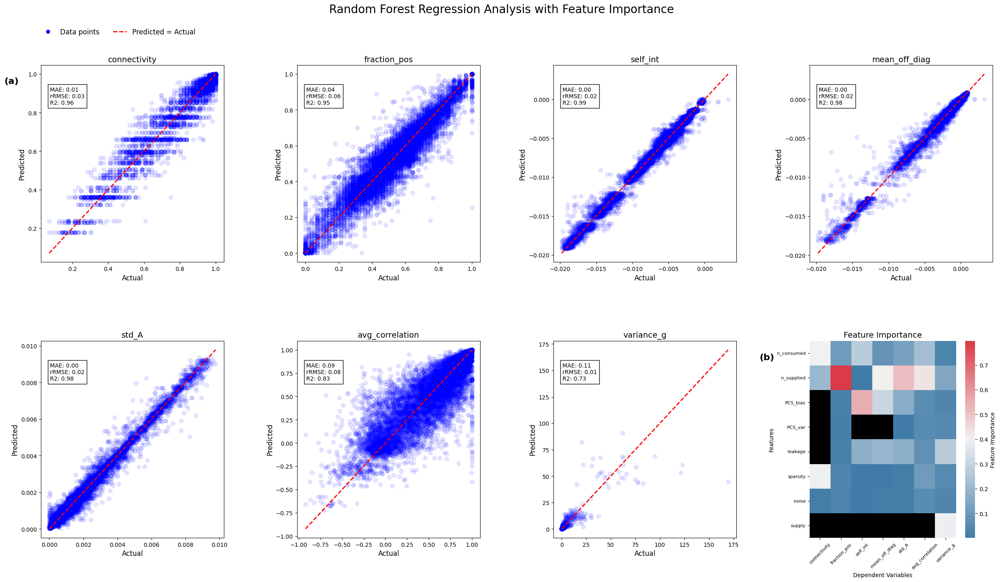

In [87]:

# Define list of dependent variables and features
dependent_vars = ['connectivity', 'fraction_pos', 'self_int', 'mean_off_diag', 'std_A', 'avg_correlation', 'variance_g']
features = ['n_consumed', 'n_supplied', 'PCS_bias', 'PCS_var', 'leakage', 'sparsity', 'noise', 'supply']

# Create a 2x4 grid of subplots
fig, axes = plt.subplots(2, 4, figsize=(30, 15), gridspec_kw={'width_ratios': [1, 1, 1, 1], 'height_ratios': [1, 1]})
fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing

# Prepare a dictionary to store the feature importances for each dependent variable
importance_dict = {feature: [] for feature in features}

# Create empty lists for handles and labels (for the legend)
handles, labels = [], []

# Iterate over the dependent variables
for i, target in enumerate(dependent_vars):
    # Check if the model exists for this target
    if target not in trained_models:
        print(f"Warning: No trained model found for dependent variable '{target}'.")
        continue

    # Retrieve the trained model and predictions
    model_info = trained_models[target]
    y_test = model_info['y_test']
    y_pred = model_info['y_pred']
    rf_model = model_info['model']

    # Initialize importance values as `np.nan` (to represent eliminated features)
    feature_importances = np.full(len(features), np.nan)

    # Update only for the selected features
    selected_features = model_info['X_train'].columns
    for feature, importance in zip(selected_features, rf_model.feature_importances_):
        feature_idx = features.index(feature)
        feature_importances[feature_idx] = importance

    # Collect feature importances
    for feature, importance in zip(features, feature_importances):
        importance_dict[feature].append(importance)

    # Calculate MAE, RMSE, and R²
    mae = np.mean(np.abs(y_test - y_pred))
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))/(np.max(y_test) - np.min(y_test))
    r2 = r2_score(y_test, y_pred)

    # Plot predicted vs actual
    ax = axes[i // 4, i % 4]  # Adjust for 2x4 layout
    scatter = ax.scatter(y_test, y_pred, c='blue', alpha=0.1, s=50)  # Data points
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)  # Actual = Predicted line

    # Set labels, title, and statistics text
    ax.set_xlabel('Actual', fontsize=12)
    ax.set_ylabel('Predicted', fontsize=12)
    ax.set_title(f'{target}', fontsize=14)
    ax.text(0.05, 0.8, f'MAE: {mae:.2f}\nrRMSE: {rmse:.2f}\nR2: {r2:.2f}', 
            transform=ax.transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.99, edgecolor='black'))

    # Collect handles and labels for the legend (add only once for the first subplot)
    if i == 0:
        handles.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label='Data points'))
        handles.append(Line2D([0], [0], color='r', linestyle='--', linewidth=2, label='Predicted = Actual'))
        labels.append('Data points')
        labels.append('Predicted = Actual')

# Convert the dictionary of feature importances to a pandas DataFrame
importance_df = pd.DataFrame(importance_dict, index=dependent_vars).T

# Custom colormap: Replace NaNs with gray in the heatmap
cmap = sns.diverging_palette(240, 10, as_cmap=True)
sns.set_palette("coolwarm")
cmap.set_bad(color='black')  # Set NaN values (eliminated features) to gray

# Fill the empty subplot (bottom-right corner) with the heatmap
heatmap_ax = axes[1, 3]
sns.heatmap(
    importance_df, 
    cmap=cmap, 
    cbar_kws={'label': 'Feature Importance'}, 
    ax=heatmap_ax,
    fmt=".2f", 
    annot_kws={'size': 10},
    mask=importance_df.isna()  # Mask for NaN values
)
heatmap_ax.set_title('Feature Importance', fontsize=14)
heatmap_ax.set_xlabel('Dependent Variables', fontsize=10)
heatmap_ax.set_ylabel('Features', fontsize=10)
heatmap_ax.tick_params(axis='x', labelrotation=45, labelsize=8)
heatmap_ax.tick_params(axis='y', labelsize=8)

# Remove the axes around the empty subplot (if applicable)
for ax in axes.flat:
    if not hasattr(ax, 'has_data') or not ax.has_data():
        fig.delaxes(ax)

# Set a main title for the figure
fig.suptitle('Random Forest Regression Analysis with Feature Importance', fontsize=20)

# Add labels (a) and (b) for the subfigures
fig.text(0.095, 0.85, "(a)", fontsize=16, fontweight="bold", transform=fig.transFigure)  # Label for the scatter plots
fig.text(0.71, 0.40, "(b)", fontsize=16, fontweight="bold", transform=fig.transFigure)  # Label for the heatmap

# Add a unified legend to the figure
fig.legend(handles=handles, labels=labels, loc='upper left', ncol=2, fontsize=12, bbox_to_anchor=(0.12, 0.95), frameon=False)

# Save the scatter plot figure as a high-resolution image
plt.savefig('random_forest_analysis_with_heatmap_and_legend.png', dpi=300, bbox_inches='tight')
plt.show()

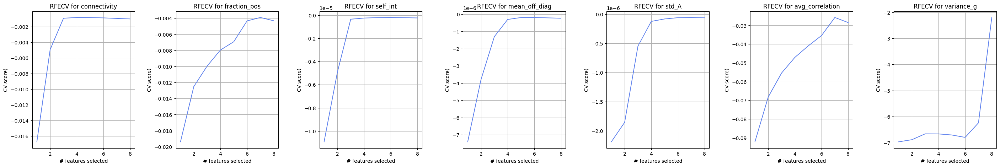

In [51]:
# Number of dependent variables
num_variables = len(dependent_vars)

# Create a figure with a row of subplots
fig = plt.figure(figsize=(35, 5))
plt.subplots_adjust(wspace=0.4)  # Adjust the width space between subplots

for i, target in enumerate(dependent_vars):
    # Retrieve the RFECV object for the current dependent variable
    rfecv = trained_models[target]['rfecv']
    
    # Create a subplot for the current dependent variable
    ax = fig.add_subplot(1, num_variables, i + 1)
    
    # Plot number of features vs. cross-validation scores
    ax.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
    ax.set_title(f"RFECV for {target}")
    ax.set_xlabel("# features selected")
    ax.set_ylabel("CV score)")
    ax.grid(True)

# Display the plot
plt.show()

/tmp/ipykernel_2048237/2326679661.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('coolwarm')  # Cool to warm color gradient


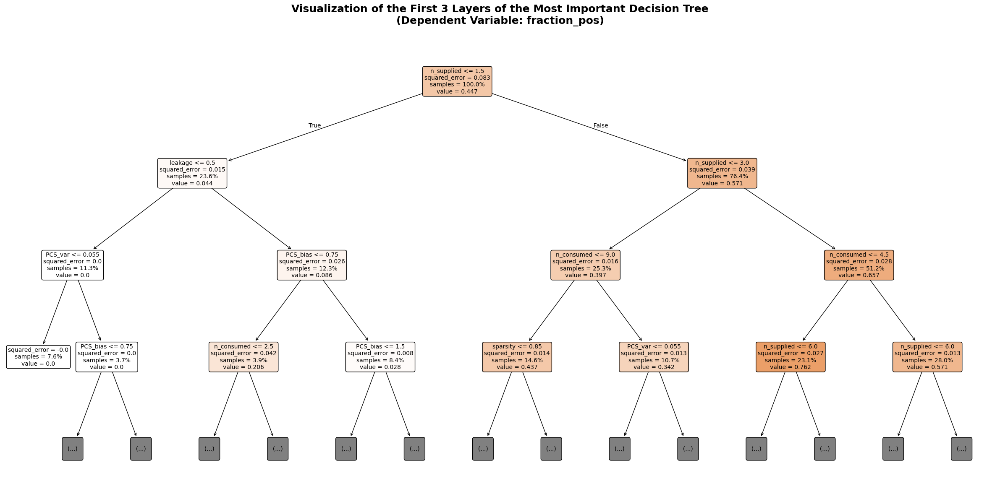

In [56]:
from sklearn.tree import plot_tree

# Define the target variable
target_variable = 'fraction_pos'

# Check if the target model exists in the trained models
if target_variable not in trained_models:
    print(f"Warning: No trained model found for dependent variable '{target_variable}'.")
else:
    # Retrieve the trained model information
    model_info = trained_models[target_variable]
    rf_model = model_info['model']

    # Compute feature importances and identify the most important decision tree
    tree_importances = rf_model.feature_importances_
    most_important_tree_idx = tree_importances.argmax()
    most_important_tree = rf_model.estimators_[most_important_tree_idx]

    # Create the figure for the decision tree visualization
    plt.figure(figsize=(24, 12))

    cmap = plt.cm.get_cmap('coolwarm')  # Cool to warm color gradient

    # Plot the tree with improved visual style
    plot_tree(
        most_important_tree,
        max_depth=3,  # Restrict to the first 3 layers for clarity
        feature_names=model_info['X_train'].columns,  # Feature names for better interpretation
        filled=True,  # Add color to nodes based on their output
        rounded=True,  # Rounded boxes for a polished appearance
        proportion=True,  # Show proportions of samples at each node
        fontsize=10
    )

    # Add a professional title and axis labels
    plt.title(
        f'Visualization of the First 3 Layers of the Most Important Decision Tree\n'
        f'(Dependent Variable: {target_variable})',
        fontsize=18,
        fontweight='bold',
        pad=20
    )
    plt.xlabel('Features and Splitting Criteria', fontsize=14, labelpad=10)
    plt.ylabel('Node Outputs (Proportions of Samples)', fontsize=14, labelpad=10)

    # Adjust layout for a clean, professional look
    plt.tight_layout()
    plt.show()